# Process optimization by genetic algorithm

job j1~j5 are non-sequencial
load is a hour  needed to finish each job
number in row x>=3 is count of jobs

how can we assign jobs to each person to minimize total time span while keeping each persons time limit.


In [370]:
include("../../src/ProcGA.jl")

Main.ProcGA

In [2]:
using CSV,DelimitedFiles
using DataFrames,Missings
using Statistics

In [3]:
using Plots

In [4]:
gr()

Plots.GRBackend()

## reading data

Read machine definition table.
Jobs column defines which object to product.

In [5]:
ptbl = CSV.read("machine.csv",header = 1)

,name,hour,jobs
1,machine1,15,[1;2;3;4]
2,machine2,15,[5;6;7;8]
3,machine3,15,[1;2;3;4;5;6;7;8]


Read object table, these will be producted by those machines.
Pcs means how many objects is made by 1 injection shot.
Runtime is in hour.

In [118]:
otbl = CSV.read("objtable.csv",header=1)

,job,min,pc,qty,runtime,shotlimit,usehour,interval
1,SS,1.5,2,4000,88.8889,800,20,8
2,AS1,1.5,2,4000,88.8889,800,20,8
3,AS2,1.5,2,4000,88.8889,800,20,8
4,TS,1.5,2,2000,44.4444,800,20,8
5,BS,1.5,1,500,5.55556,800,20,8
6,CL1,2.0,2,3000,50.0,800,27,8
7,CL2,2.0,2,3000,50.0,800,27,8
8,ACL,2.0,2,100,1.66667,800,27,8
9,BCL,2.0,2,1000,16.6667,800,27,8
10,ECL,2.0,2,200,3.33333,800,27,8


In [70]:
# create joblist from object table
jlst = Array{Int,1}()
for i in 1:size(otbl,1)
    v = repeat([i],ceil(Int, otbl[:runtime][i]))
    append!(jlst,v)
end

In [71]:
length(jlst)

441

Assign this list to machines.

In [392]:
# columns needed to store enough assign table.
xcol = length(jlst)

441

In [393]:
# make zero table
gbs = zeros(Int,(size(ptbl,1),xcol))

3×441 Array{Int64,2}:
 0  0  0  0  0  0  0  0  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0

In [394]:
# assign joblist to gbs
for i in 1:length(jlst)
    gbs[i] = jlst[i]
end

In [395]:
gbs

3×441 Array{Int64,2}:
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0

In [396]:
assignlist =[ eval(Meta.parse(x)) for x in ptbl[:jobs]]

3-element Array{Array{Int64,1},1}:
 [1, 2, 3, 4]            
 [5, 6, 7, 8]            
 [1, 2, 3, 4, 5, 6, 7, 8]

## Initialize table

In [397]:
ProcGA.setassigntable(assignlist)

3-element Array{Array{Int64,1},1}:
 [1, 2, 3, 4]            
 [5, 6, 7, 8]            
 [1, 2, 3, 4, 5, 6, 7, 8]

## Defining penalty functions

You can give your own penalty function when needed.

In [398]:
# consequtive use limit 
function penalty1(jtbl::Array{Int,2})
    p = 0
    rw,col = size(jtbl)
    lmt = otbl[:usehour]
    intvl = otbl[:interval]
    
    for i in 1:rw
        cnt = 0
        x0 = 0
        for j in 1:col
            x = jtbl[i,j]
            if x != x0
                if x0 > 0
                    if cnt > lmt[x0]
                        p += (cnt-lmt[x0])
                    end
                end
                # reset
                x0 = x
                cnt = 0
            else
                cnt += 1
            end
        end
    end
    p
end

penalty1 (generic function with 2 methods)

In [399]:
penalty1(gbs)

78

In [401]:
#  check item occur in each column
function uselist(item, jtbl::Array{Int,2})
    col = size(jtbl,2)
    lst = zeros(Int,col)
    for j in 1:col
        c = jtbl[:,j]
        if item in c
            lst[j] = 1
        end
    end
    lst
end

uselist (generic function with 2 methods)

In [402]:
function countinterval(item, lst::Array{Int,1})
    p = 0
    intvl = otbl[:interval][item]
    used = false
    cnt = 0
    for x in 1:length(lst)
        if x > 0
            if ~used
                p += (intvl > cnt) ? (intvl - cnt) : 0
            end
            used = true
            cnt = 0
        else
            used = false
            cnt += 1
        end
    end
    p
end

countinterval (generic function with 2 methods)

In [403]:
# check interval span
function penalty2(jtbl::Array{Int,2})
    p = 0
    for itm in 1:length(otbl[:interval])
        utbl = uselist(itm,jtbl)
        p += countinterval(itm, utbl)
    end
    p
end

penalty2 (generic function with 2 methods)

In [404]:
penalty2(gbs)

80

In [405]:
ProcGA.dupenalty(gbs)

289

In [406]:
# penalty
#  validlength
function mypenalty(jtbl::Array{Int,2})
    p = 0
#     p += ProcGA.validlength(jtbl)
#     p += ProcGA.dupenalty(jtbl) # weight
    p += penalty1(jtbl)
    p += penalty2(jtbl)
    p
end

mypenalty (generic function with 2 methods)

In [407]:
mypenalty(gbs)

158

In [408]:
ProcGA.penalty(jtbl::Array{Int,2}) = mypenalty(jtbl)

## reassignment

In [409]:
ProcGA.findassignnum(5)

2-element Array{Any,1}:
 2
 3

In [410]:
findfirst(x->x==0, gbs[1,:])

148

In [411]:
ProcGA.assignjob!(gbs)

3×441 Array{Int64,2}:
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0

In [412]:
ProcGA.penalty(gbs)

152

## Initialize population

In [66]:
savedfile = "bestprc_heuristics.csv"

"bestprc_heuristics.csv"

In [413]:
# create population from savedfile or make new
if isfile(savedfile)
    println("read from $savedfile")
    gbs = readdlm(savedfile, ',', Int)
    if size(gbs)[2] < size(g1)[2]
        # append zero
        c2 = size(gbs)[2]
        gbs = hcat(gbs,g1[:,(c2+1):end])
    end
else
    println("Use \"gbs\" above.")
end
gbs

Use "gbs" above.


3×441 Array{Int64,2}:
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  0  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  1  1  1  1  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0

Make population.
Half of it is from best data and latter half is randomly made.

In [414]:
if isfile(savedfile)
    ppl = ProcGA.populatefrom(gbs,50);
    ppl = vcat(ppl, ProcGA.populateshuffle(gbs,150));
else
    ppl = ProcGA.populateshuffle(gbs,500);
end
ProcGA.orderjob!.(ppl);

## Evolution!

In [415]:
# first sort ppl by their penalties
ProcGA.sortpopulation!(ppl);

In [416]:
v = ProcGA.penalty.(ppl);

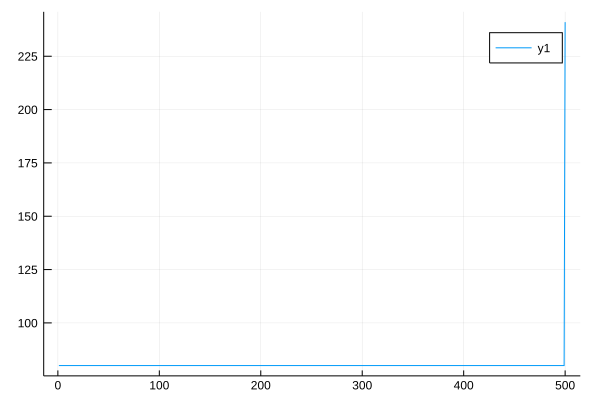

In [417]:
x = 1:length(v)
plot(x,v)

In [418]:
vlst = [[minimum(v), Int(round(median(v))), maximum(v)]]

1-element Array{Array{Int64,1},1}:
 [80, 80, 241]

In [419]:
# Proceed generation
# size, counter, survival rate, elite rate, mutation rate
# default rates : 0.8, 0.2, 0.05
# enable jobswitching between available rows
vl = ProcGA.evolution!(ppl, 100, 5, 0.2, 0.2, 1, true);
vlst = vcat(vlst,vl);

i:5 => [80, 80, 93]
i:10 => [80, 80, 92]
i:15 => [80, 80, 101]
i:20 => [80, 80, 92]
i:25 => [80, 80, 99]
i:30 => [80, 80, 98]
i:35 => [80, 80, 92]
i:40 => [80, 80, 102]
i:45 => [80, 80, 91]
i:50 => [80, 80, 95]
i:55 => [80, 80, 92]
i:60 => [80, 80, 93]
i:65 => [80, 80, 102]
i:70 => [80, 80, 89]
i:75 => [80, 80, 98]
i:80 => [80, 80, 92]
i:85 => [80, 80, 91]
i:90 => [80, 80, 98]
i:95 => [80, 80, 104]
i:100 => [80, 80, 93]


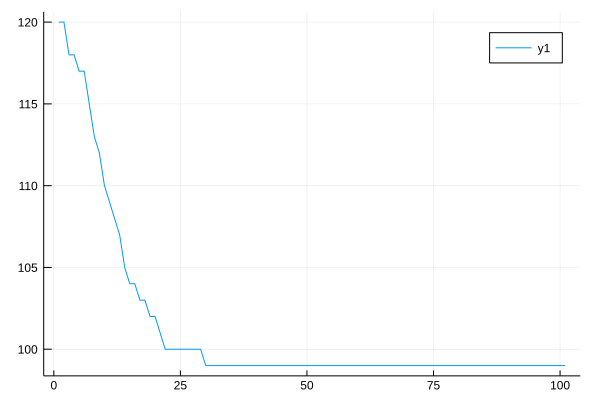

In [367]:
y = (x->x[1]).(vlst);
x = 1:length(y);

plot(x,y)

Pick up the best data.

In [421]:
v = ProcGA.penalty.(ppl)
idm = findmin(v)[2]
bestgen = ppl[idm]

3×441 Array{Int64,2}:
 1  1  1  1  1  1  1  1  1  1  1  1  1  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  5  0  0  0  0  0  0  0     0  0  0  0  0  0  0  0  0  0  0  0
 1  0  0  0  1  0  0  0  1  0  1  0  0     0  0  0  0  0  0  0  0  0  0  0  0

In [80]:
# save best process table to file.
# do not clip it so that it can be used again
writedlm("bestprc.csv",bestgen, ',')

## Conclusion

## check functions (test)

In [420]:
function checkpenalties(jtbl)
    p1 = ProcGA.validlength(jtbl)
    p2 = ProcGA.dupenalty(jtbl)
    p3 = penalty1(jtbl)
    p4 = penalty2(jtbl)
    p1,p2,p3,p4
end

checkpenalties (generic function with 1 method)

In [422]:
checkpenalties(bestgen)

(311, 36, 0, 80)

In [430]:
checkpenalties(bestgen)

(311, 33, 0, 80)

In [423]:
checkpenalties.(ppl[1:20])

20-element Array{NTuple{4,Int64},1}:
 (311, 36, 0, 80)
 (315, 35, 0, 80)
 (328, 26, 0, 80)
 (316, 32, 0, 80)
 (331, 32, 0, 80)
 (329, 33, 0, 80)
 (326, 24, 0, 80)
 (315, 42, 0, 80)
 (327, 34, 0, 80)
 (320, 26, 0, 80)
 (317, 30, 0, 80)
 (318, 28, 0, 80)
 (325, 26, 0, 80)
 (321, 50, 0, 80)
 (314, 34, 0, 80)
 (308, 34, 0, 80)
 (320, 30, 0, 80)
 (305, 33, 0, 80)
 (313, 38, 0, 80)
 (319, 26, 0, 80)

In [429]:
bestgen[:,1:20]

3×20 Array{Int64,2}:
 1  1  1  1  1  1  1  4  4  0  1  3  1  1  0  1  1  4  1  1
 0  0  0  0  0  5  0  0  0  0  0  0  0  0  0  2  5  0  0  5
 0  0  0  0  1  0  0  0  1  0  1  0  0  1  1  0  1  4  1  0

In [432]:
transpose(uselist(1,bestgen))

1×441 LinearAlgebra.Transpose{Int64,Array{Int64,1}}:
 1  1  1  1  1  1  1  0  1  0  1  0  1  …  0  0  0  0  0  0  0  0  0  0  0  0

In [428]:
for i in 1:100 
    ProcGA.switchjob!(bestgen)
end

In [220]:
c1,c2 = ProcGA.crossover(ppl[2],ppl[3])

([0 0 … 0 0; 0 0 … 0 0; 1 1 … 0 0], [0 0 … 0 0; 0 0 … 0 0; 1 1 … 0 0])

In [327]:
c1 == c2

false

In [328]:
checkpenalties.([ppl[2],ppl[3]])

2-element Array{NTuple{4,Int64},1}:
 (252, 0, 0, 80)
 (252, 0, 0, 80)

In [329]:
checkpenalties.([c1,c2])

2-element Array{NTuple{4,Int64},1}:
 (273, 0, 0, 80) 
 (252, 60, 0, 80)

In [330]:
ProcGA.switchjob!(c1)

3×294 Array{Int64,2}:
 0  0  0  0  1  0  0  1  0  0  0  0  0  …  0  0  0  0  0  0  0  0  0  0  0  0
 0  0  0  0  0  2  0  0  4  0  0  5  5     0  0  0  0  0  0  0  0  0  0  0  0
 1  1  1  1  0  1  1  0  1  1  1  1  1     0  0  0  0  0  0  0  0  0  0  0  0

In [331]:
checkpenalties(c1)

(273, 0, 0, 80)

In [240]:
function switchjob1!(jtbl::Array{Int,2}, atbl = ProcGA.assigntable)
    rw = size(jtbl,1)
    col = ProcGA.validlength(jtbl)
    
    r1 = rand(1:rw)
    c1 = rand(1:col)
    r2 = sample(ProcGA.findassignnum(r1,atbl),1)[1]
    c2 = sample(1:col,1)[1]
    jtbl[r1,c1],jtbl[r2,c2] = jtbl[r2,c2], jtbl[r1,c1]
    println("($r1,$c1): <=> ($r2,$c2)")
    jtbl[r1,c1], jtbl[r2,c2]
end

switchjob1! (generic function with 2 methods)

In [332]:
switchjob1!(c1)

(2,166): <=> (3,31)


(1, 0)

In [333]:
checkpenalties(c2)

(252, 60, 0, 80)